# BANK MARKETING: Predicting Whether The Customer Will Subscribe To Term Deposit (FIXED DEPOSIT) or not.

## Business Use Case
There has been a revenue decline for a Portuguese bank and they would like to know what actions to take. After investigation, they found out that the root cause is that their clients are not depositing as frequently as before. Knowing that term deposits allow banks to hold onto a deposit for a specific amount of time, so banks can invest in higher gain financial products to make a profit. In addition, banks also hold better chance to persuade term deposit clients into buying other products such as funds or insurance to further increase their revenues. As a result, the Portuguese bank would like to identify existing clients that have higher chance to subscribe for a term deposit and focus marketing efforts on such clients.

## Problem Statement:

Your client is a retail banking institution. Term deposits are a major source of income for a bank. A term deposit is a cash investment held at a financial institution. Your money is invested for an agreed rate of interest over a fixed amount of time, or term. The bank has various outreach plans to sell term deposits to their customers such as email marketing, advertisements, telephonic marketing and digital marketing. Telephonic marketing campaigns still remain one of the most effective way to reach out to people. However, they require huge investment as large call centers are hired to actually execute these campaigns. Hence, it is crucial to identify the customers most likely to convert beforehand so that they can be specifically targeted via call.

You are provided with the client data such as : age of the client, their job type, their marital status, etc. Along with the client data, you are also provided with the information of the call such as the duration of the call, day and month of the call, etc. Given this information, your task is to predict if the client will subscribe to term deposit.

## About The Dataset:
The dataset is related with direct marketing campaigns (phone calls) of a Portuguese banking institution. The classification goal of this dataset is to predict if the client or the customer of polish banking institution will subscribe a term deposit product of the bank or not. 

## Requirement
Predict:Whether the client will subscribe for a term deposit? (YES/NO)

In [1]:
# importing the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
import warnings
warnings.filterwarnings("ignore")

In [2]:
# loading the dataset
df_bank=pd.read_csv("term deposit train.csv")
df_bank

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,26110,56,admin.,married,unknown,no,1933,no,no,telephone,19,nov,44,2,-1,0,unknown,no
1,40576,31,unknown,married,secondary,no,3,no,no,cellular,20,jul,91,2,-1,0,unknown,no
2,15320,27,services,married,secondary,no,891,yes,no,cellular,18,jul,240,1,-1,0,unknown,no
3,43962,57,management,divorced,tertiary,no,3287,no,no,cellular,22,jun,867,1,84,3,success,yes
4,29842,31,technician,married,secondary,no,119,yes,no,cellular,4,feb,380,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,36483,29,management,single,tertiary,no,0,yes,no,cellular,12,may,116,2,-1,0,unknown,no
31643,40178,53,management,divorced,tertiary,no,380,no,yes,cellular,5,jun,438,2,-1,0,unknown,yes
31644,19710,32,management,single,tertiary,no,312,no,no,cellular,7,aug,37,3,-1,0,unknown,no
31645,38556,57,technician,married,secondary,no,225,yes,no,telephone,15,may,22,7,337,12,failure,no


### Description of all the variables :

* ID: Unique client ID
* age: Age of the client
* job: Type of job
* marital: Marital status of the client
* education: Education level
* default: Credit in default.
* housing: Housing loan
* loan: Personal loan
* contact: Type of communication
* month: Contact month
* day_of_week: Day of week of contact
* duration: Contact duration
* campaign: number of contacts performed during this campaign to the client
* pdays: number of days that passed by after the client was last contacted
* previous: number of contacts performed before this campaign
* poutcome: outcome of the previous marketing campaign

As we have to predict about the Yes or No for a subscription of Term Deposit, we will build a Classification Model

## Starting the EDA

In [3]:
df_bank.shape

(31647, 18)

In [4]:
df_bank.columns

Index(['ID', 'age', 'job', 'marital', 'education', 'default', 'balance',
       'housing', 'loan', 'contact', 'day', 'month', 'duration', 'campaign',
       'pdays', 'previous', 'poutcome', 'subscribed'],
      dtype='object')

In [5]:
df_bank.dtypes

ID             int64
age            int64
job           object
marital       object
education     object
default       object
balance        int64
housing       object
loan          object
contact       object
day            int64
month         object
duration       int64
campaign       int64
pdays          int64
previous       int64
poutcome      object
subscribed    object
dtype: object

Obs- We can see the data in columns contain both continuous and categorical data, and therefore we will be encoding those columns later 

In [6]:
#Checking null values
df_bank.isnull().sum()

ID            0
age           0
job           0
marital       0
education     0
default       0
balance       0
housing       0
loan          0
contact       0
day           0
month         0
duration      0
campaign      0
pdays         0
previous      0
poutcome      0
subscribed    0
dtype: int64

Obs- The dataset contains no missing values

In [7]:
#Checking the number of unique values in all columns
df_bank.nunique()

ID            31647
age              76
job              12
marital           3
education         4
default           2
balance        6326
housing           2
loan              2
contact           3
day              31
month            12
duration       1454
campaign         45
pdays           509
previous         38
poutcome          4
subscribed        2
dtype: int64

In [8]:
df_bank.describe()

,ID,age,balance,day,duration,campaign,pdays,previous
count,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000,31647.000000
mean,22563.972162,40.957247,1363.890258,15.835466,258.113534,2.765697,39.576042,0.574272
std,13075.936990,10.625134,3028.304293,8.337097,257.118973,3.113830,99.317592,2.422529
min,2.000000,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,11218.000000,33.000000,73.000000,8.000000,104.000000,1.000000,-1.000000,0.000000
50%,22519.000000,39.000000,450.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,33879.500000,48.000000,1431.000000,21.000000,318.500000,3.000000,-1.000000,0.000000
max,45211.000000,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


Obs- The mean in columns"age","balance","duration","campaign","pdays","previous" is greater than median , and thus we can say data is right skewed.

The mean in column"day" is less than median and thus we can say data in this column is left skewed

## Data Visualization

### Univariate Analysis

blue-collar      6842
management       6639
technician       5307
admin.           3631
services         2903
retired          1574
self-employed    1123
entrepreneur     1008
unemployed        905
housemaid         874
student           635
unknown           206
Name: job, dtype: int64


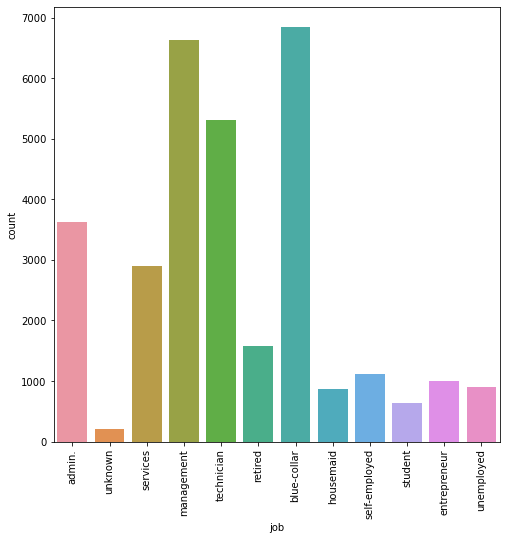

In [9]:
#Count plot for Job type
plt.figure(figsize=(8,8))
print(df_bank["job"].value_counts())
sns.countplot(x="job", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can see the bank has max members with job "blue-collar-6842", followed by "management-6639", then "technician 5307" and least no of "student-635" and few whose profile is "unknown"

married     19095
single       8922
divorced     3630
Name: marital, dtype: int64


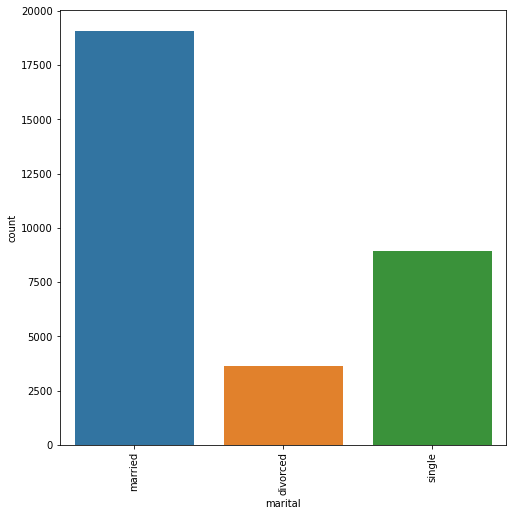

In [10]:
#Count plot for marital type
plt.figure(figsize=(8,8))
print(df_bank["marital"].value_counts())
sns.countplot(x="marital", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs-We can observe maximum of bank members are "married-19095", followed by "single-8922" and minimum "divorced-3630"

secondary    16224
tertiary      9301
primary       4808
unknown       1314
Name: education, dtype: int64


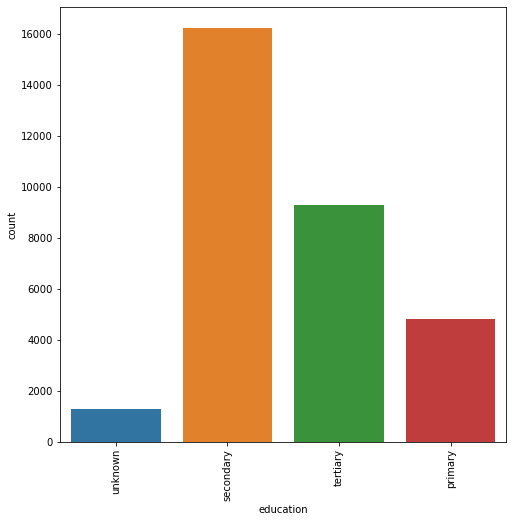

In [11]:
#Count plot for education type
plt.figure(figsize=(8,8))
print(df_bank["education"].value_counts())
sns.countplot(x="education", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can observe max customers of bank have taken "secondary education-16224",many have even taken"tertiary education-9301", and other have taken atleast "primary education-4808", and few others whose education is "unknown" 

no     31062
yes      585
Name: default, dtype: int64


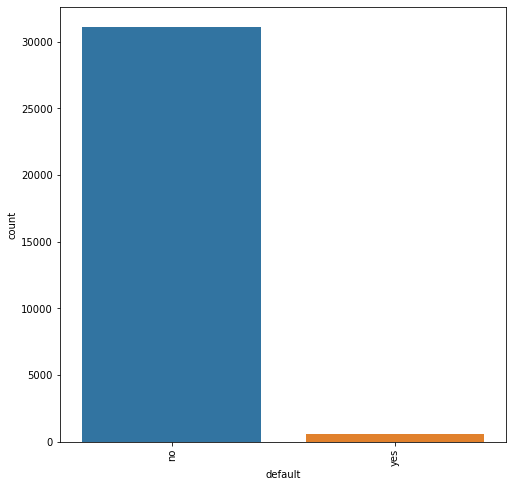

In [12]:
#Count plot for default type
plt.figure(figsize=(8,8))
print(df_bank["default"].value_counts())
sns.countplot(x="default", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can observe , the bank has very good and reputed clients and that can be infered from "default_no=31062" and"default_yes=585"

yes    17584
no     14063
Name: housing, dtype: int64


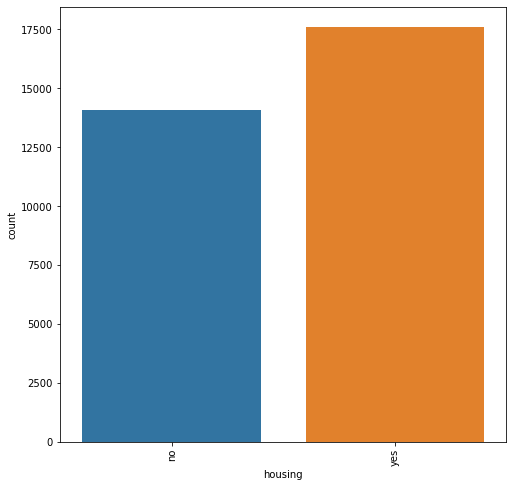

In [13]:
#Count plot for housing-loan type
plt.figure(figsize=(8,8))
print(df_bank["housing"].value_counts())
sns.countplot(x="housing", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- The customers who have taken housing_loan=17584 and who haven't=14063

no     26516
yes     5131
Name: loan, dtype: int64


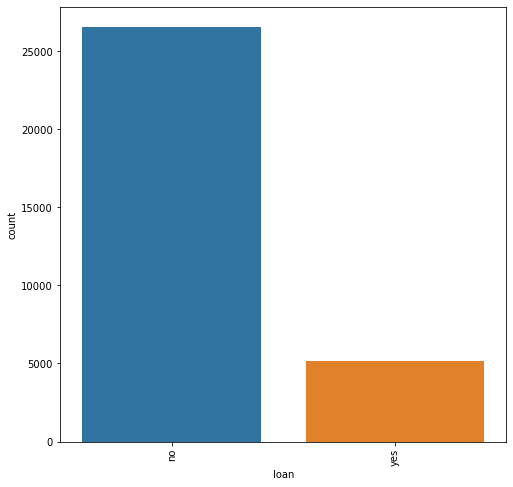

In [14]:
#Count plot for loan type
plt.figure(figsize=(8,8))
print(df_bank["loan"].value_counts())
sns.countplot(x="loan", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can observe ver few of the customers have taken personal loan "yes-5131" and most haven't "no-26516"

cellular     20423
unknown       9177
telephone     2047
Name: contact, dtype: int64


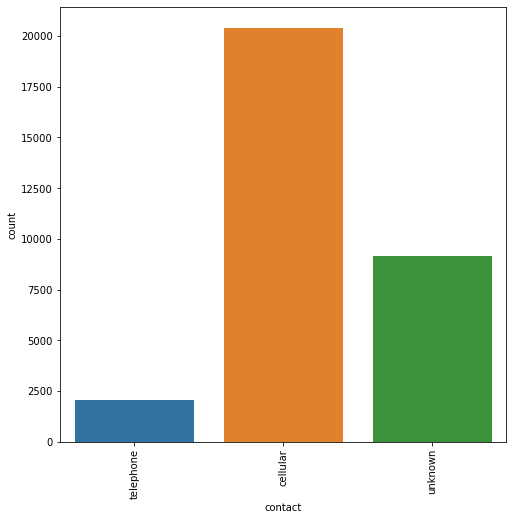

In [15]:
#Count plot for contact type
plt.figure(figsize=(8,8))
print(df_bank["contact"].value_counts())
sns.countplot(x="contact", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can see most of the customers were contacted through"cellular-20423",min with"telephone-2047" and others whose source is "unknown-9177" 

may    9669
jul    4844
aug    4333
jun    3738
nov    2783
apr    2055
feb    1827
jan     977
oct     512
sep     410
mar     342
dec     157
Name: month, dtype: int64


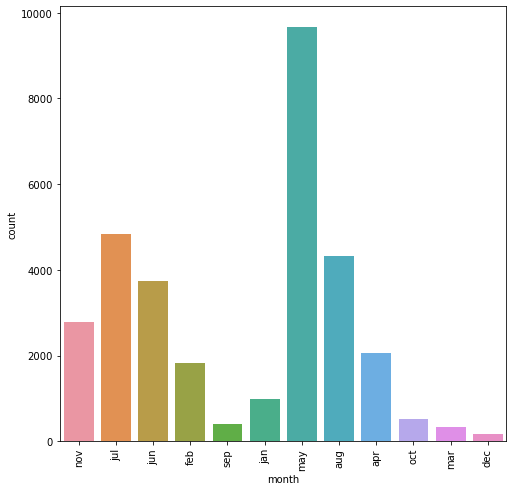

In [16]:
#Count plot for month type
plt.figure(figsize=(8,8))
print(df_bank["month"].value_counts())
sns.countplot(x="month", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs-We can see most customers are contacted in the month "may-9669" and least in "dec-157"

unknown    25929
failure     3362
other       1288
success     1068
Name: poutcome, dtype: int64


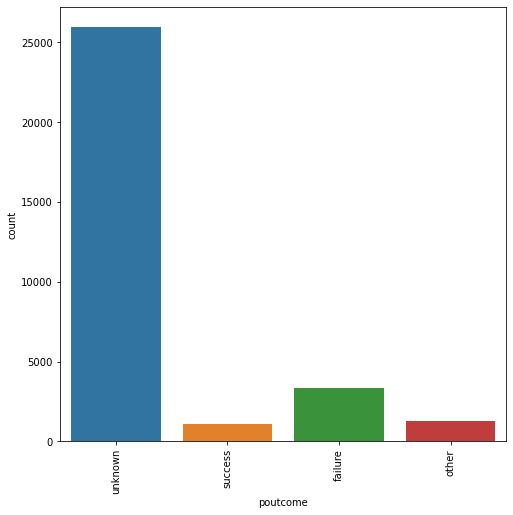

In [17]:
#Count plot for poutcome type
plt.figure(figsize=(8,8))
print(df_bank["poutcome"].value_counts())
sns.countplot(x="poutcome", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can see the outcome of the previous marketing campaign is very dissappointing since max results is "unknown-25929","failure-3362","other-1288" and least"success-1068"

no     27932
yes     3715
Name: subscribed, dtype: int64


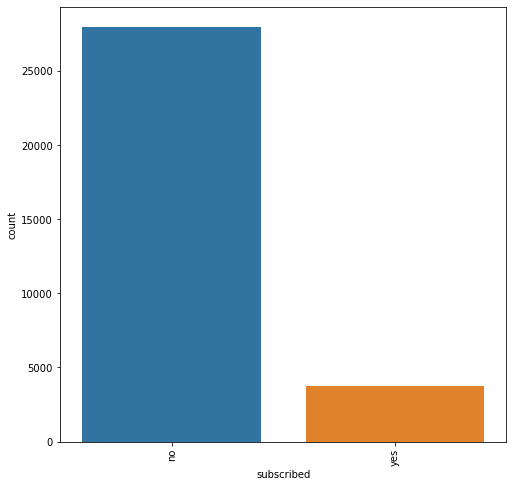

In [18]:
#Count plot for subscribed type
plt.figure(figsize=(8,8))
print(df_bank["subscribed"].value_counts())
sns.countplot(x="subscribed", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can see the outcome of campaigning is not very fruitful as count of subscribed= "yes-3715" and "no-27932"

Also we can say the target data is highly imbalanced , would be balancing it later

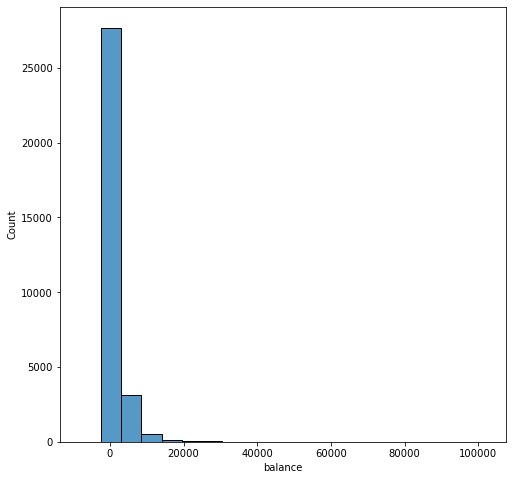

In [19]:
#Hist plot on balance
plt.figure(figsize=(8,8))
sns.histplot(x=df_bank["balance"],bins=20)
plt.show()

Obs- We can see maximum people have 0 balance in their accounts, and the max amount of the balance in people is not more than 5000

### Bivariate Analysis

blue-collar      6842
management       6639
technician       5307
admin.           3631
services         2903
retired          1574
self-employed    1123
entrepreneur     1008
unemployed        905
housemaid         874
student           635
unknown           206
Name: job, dtype: int64


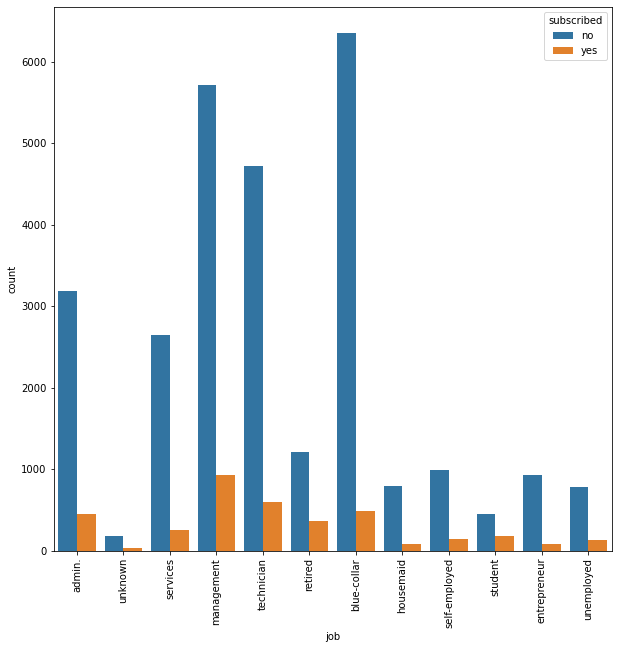

In [20]:
#Count plot for Job type
plt.figure(figsize=(10,10))
print(df_bank["job"].value_counts())
sns.countplot(x="job",hue="subscribed",data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can see the maximum people who have subscribed for term deposit are from job_category "Management", followed by "Technician", then "Blue-Collar" and "admins" an the least subsribed people are those who are "entrepreneur"

married     19095
single       8922
divorced     3630
Name: marital, dtype: int64


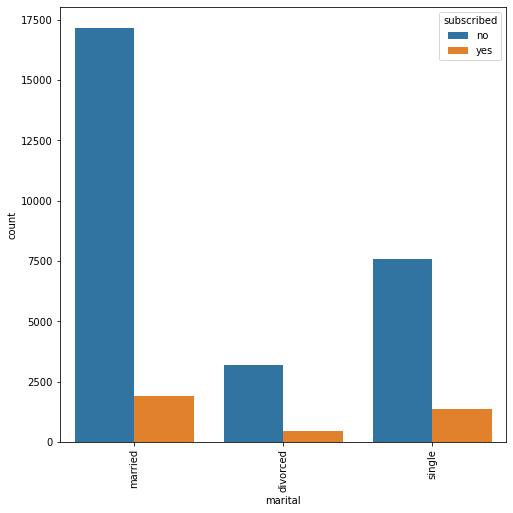

In [21]:
#Count plot for marital type
plt.figure(figsize=(8,8))
print(df_bank["marital"].value_counts())
sns.countplot(x="marital",hue="subscribed", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- The customers who are "married" have comparitively subscribed more, followed by "single" and least 'divorced'

secondary    16224
tertiary      9301
primary       4808
unknown       1314
Name: education, dtype: int64


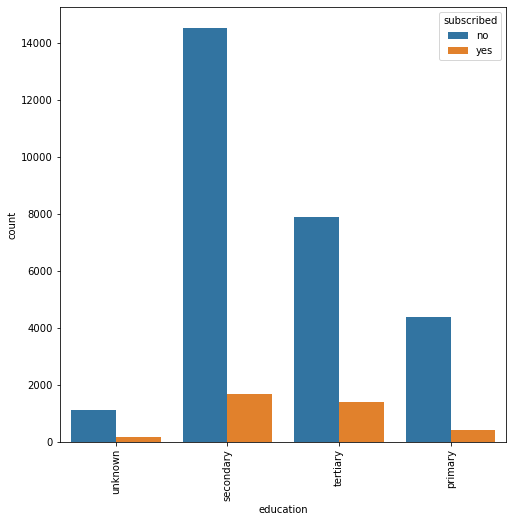

In [22]:
#Count plot for education type
plt.figure(figsize=(8,8))
print(df_bank["education"].value_counts())
sns.countplot(x="education",hue="subscribed", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can see people who have subscribed are more whose education is"seconadary"or"tertiary"

no     31062
yes      585
Name: default, dtype: int64


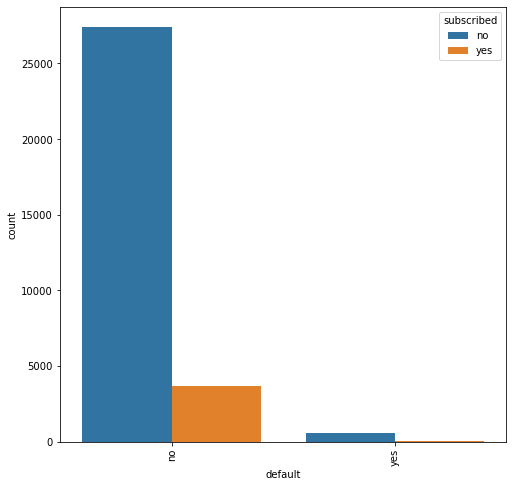

In [23]:
#Count plot for default type
plt.figure(figsize=(8,8))
print(df_bank["default"].value_counts())
sns.countplot(x="default",hue="subscribed", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can observe the people who have subsribed for have no default record

yes    17584
no     14063
Name: housing, dtype: int64


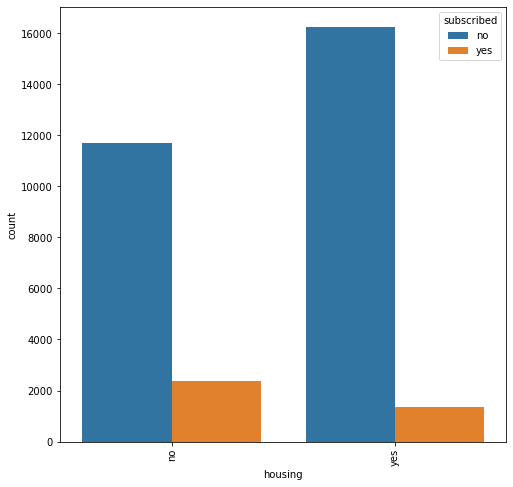

In [24]:
#Count plot for housing-loan type
plt.figure(figsize=(8,8))
print(df_bank["housing"].value_counts())
sns.countplot(x="housing",hue="subscribed", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can see the customers who have taken housing loan have subscribed less in percentage as compared to those who have not taken the housing loan. 

no     26516
yes     5131
Name: loan, dtype: int64


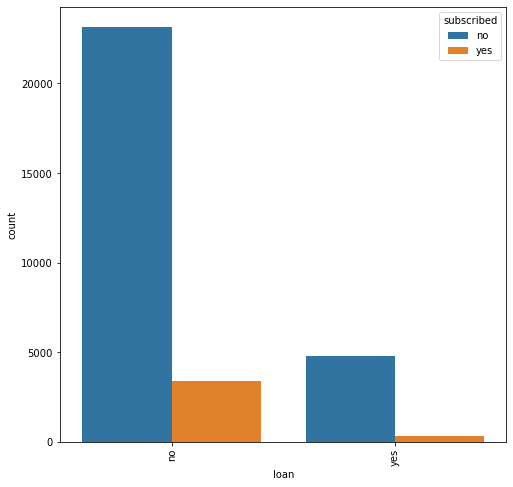

In [25]:
#Count plot for loan type
plt.figure(figsize=(8,8))
print(df_bank["loan"].value_counts())
sns.countplot(x="loan",hue="subscribed", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- We can see the customers who have taken loan have subscribed less in percentage as compared to those who have not taken the loan.
reason being most people cannot invest at multiple places

cellular     20423
unknown       9177
telephone     2047
Name: contact, dtype: int64


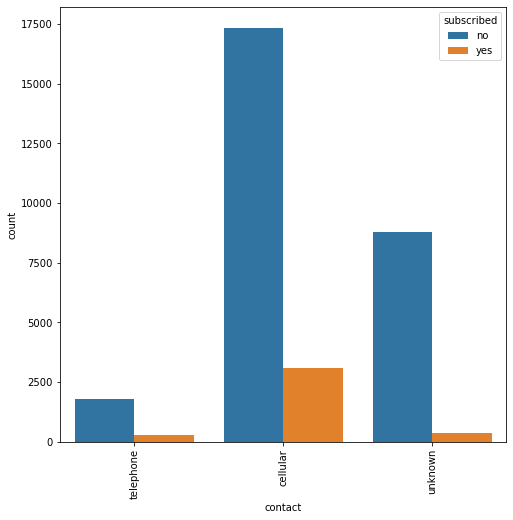

In [26]:
#Count plot for contact type
plt.figure(figsize=(8,8))
print(df_bank["contact"].value_counts())
sns.countplot(x="contact",hue="subscribed", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs-The max communication was done through cellular network and most of the customers contacted through cellular network have subscribed

unknown    25929
failure     3362
other       1288
success     1068
Name: poutcome, dtype: int64


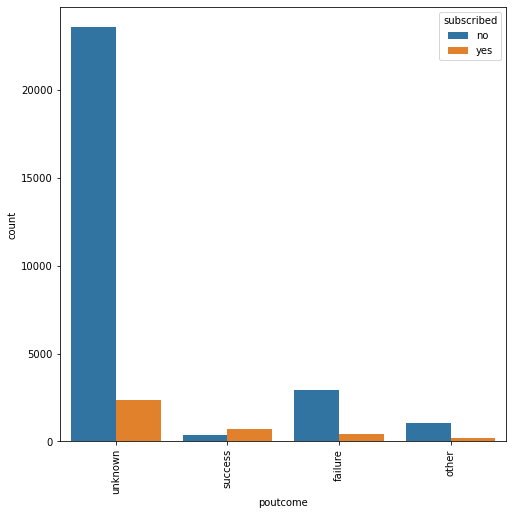

In [28]:
#Count plot for contact type
plt.figure(figsize=(8,8))
print(df_bank["poutcome"].value_counts())
sns.countplot(x="poutcome",hue= "subscribed", data=df_bank)
plt.xticks(rotation=90)
plt.show()

Obs- we can say the customers who have successfully subscribed from the previous marketing campaign will be most likely to subscribe again.

<AxesSubplot:xlabel='previous', ylabel='Density'>

<Figure size 720x1440 with 0 Axes>

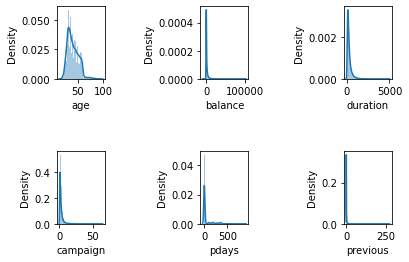

In [29]:
# Next, we will plot distribution plot of all continuous columns in same figure(to check skewness)
plt.figure(figsize=(10,20))
fig, axes = plt.subplots(2,3)
fig.subplots_adjust(hspace=1, wspace=2)

sns.distplot(df_bank['age'], ax=axes[0,0])
sns.distplot(df_bank['balance'], ax=axes[0,1])
sns.distplot(df_bank['duration'], ax=axes[0,2])
sns.distplot(df_bank['campaign'], ax=axes[1,0])
sns.distplot(df_bank['pdays'], ax=axes[1,1])
sns.distplot(df_bank['previous'], ax=axes[1,2])

Obs- We can see the data is skewed in all the above columns, so treating ir further

ID             AxesSubplot(0.125,0.536818;0.168478x0.343182)
age         AxesSubplot(0.327174,0.536818;0.168478x0.343182)
balance     AxesSubplot(0.529348,0.536818;0.168478x0.343182)
day         AxesSubplot(0.731522,0.536818;0.168478x0.343182)
duration          AxesSubplot(0.125,0.125;0.168478x0.343182)
campaign       AxesSubplot(0.327174,0.125;0.168478x0.343182)
pdays          AxesSubplot(0.529348,0.125;0.168478x0.343182)
previous       AxesSubplot(0.731522,0.125;0.168478x0.343182)
dtype: object

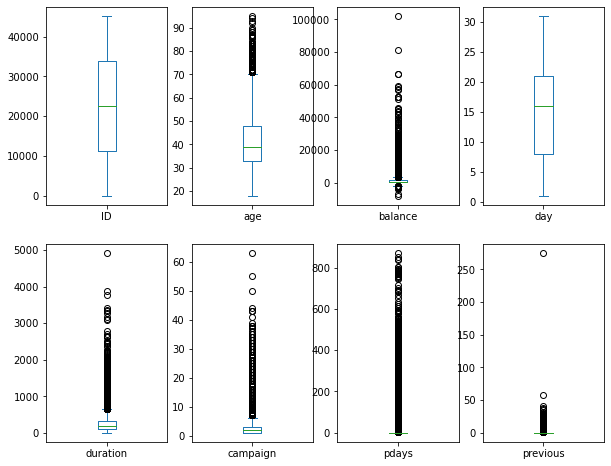

In [30]:
#Next, we will plot box plot of all columns in same figure(to check outliers)
df_bank.plot(kind='box',subplots=True,layout=(2,4),figsize=(10,8))

Obs-We can see huge amount of outliers are present in the columns, removing the outliers further

## Data Cleaning and Pre-Processing

### Deleting the unwanted columns
Deleting 'ID' as its not useful for our model performance, also deleting cotact column, as mode is not important and any mode of communication can be fruitful if properly communicated

In [31]:
df_bank.drop('ID',axis = 1,inplace = True)
df_bank.shape

(31647, 17)

In [32]:
df_bank.drop('contact',axis = 1,inplace = True)
df_bank.shape

(31647, 16)

### Encoding Categorical Data

In [33]:
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()
df_bank['job']=le.fit_transform(df_bank['job'])
df_bank['marital']=le.fit_transform(df_bank['marital'])
df_bank['education']=le.fit_transform(df_bank['education'])
df_bank['default']=le.fit_transform(df_bank['default'])
df_bank['housing']=le.fit_transform(df_bank['housing'])
df_bank['loan']=le.fit_transform(df_bank['loan'])
df_bank['month']=le.fit_transform(df_bank['month'])
df_bank['poutcome']=le.fit_transform(df_bank['poutcome'])
df_bank['subscribed']=le.fit_transform(df_bank['subscribed'])
df_bank

,age,job,marital,education,default,balance,housing,loan,day,month,duration,campaign,pdays,previous,poutcome,subscribed
0,56,0,1,3,0,1933,0,0,19,9,44,2,-1,0,3,0
1,31,11,1,1,0,3,0,0,20,5,91,2,-1,0,3,0
2,27,7,1,1,0,891,1,0,18,5,240,1,-1,0,3,0
3,57,4,0,2,0,3287,0,0,22,6,867,1,84,3,2,1
4,31,9,1,1,0,119,1,0,4,3,380,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31642,29,4,2,2,0,0,1,0,12,8,116,2,-1,0,3,0
31643,53,4,0,2,0,380,0,1,5,6,438,2,-1,0,3,1
31644,32,4,2,2,0,312,0,0,7,1,37,3,-1,0,3,0
31645,57,9,1,1,0,225,1,0,15,8,22,7,337,12,0,0


Obs- The Label Encoder has encoded the categorical values as:

* "job": admin- 0, blue-collar-1, entrepreneur-2, housemaid-3,management-4,retired-5,self-employed-6,services-7,student-8,technician-9,unemployed-10,unknown-11
* "marital": divorced-0, married-1,single-2
* "education":primary-0, secondary-1,tertiary-2,unknown-3
* "default":no-0, yes-1
* "housing":no-0, yes-1
* "loan":no-0, yes-1
* "month": aug-0,apr-1,dec-2,feb-3,jan-4,jul-5,jun-6,mar-7,may-8,nov-9,oct-10,sep-11
* "poutcome": failure-0, other-1, success-2,unknown-3
* "subscribed":no-0, yes-1

### Checking Correlation

In [34]:
df_bank.corr()

,age,job,marital,education,default,balance,housing,loan,day,month,duration,campaign,pdays,previous,poutcome,subscribed
age,1.000000,-0.020765,-0.406024,-0.102356,-0.016117,0.103245,-0.183775,-0.012657,-0.011056,-0.038368,-0.003870,0.005733,-0.021947,0.005761,0.006466,0.024538
job,-0.020765,1.000000,0.066124,0.170347,-0.005217,0.020638,-0.125347,-0.039049,0.020951,-0.089384,0.002694,0.001469,-0.022552,-0.003032,0.007101,0.038921
marital,-0.406024,0.066124,1.000000,0.107547,-0.009591,0.003487,-0.017846,-0.041654,-0.007686,-0.003834,0.011544,-0.009394,0.019741,0.012717,-0.019770,0.046043
education,-0.102356,0.170347,0.107547,1.000000,-0.006774,0.065176,-0.095376,-0.045950,0.017902,-0.055967,0.003842,0.006142,-0.001566,0.015280,-0.019007,0.066051
default,-0.016117,-0.005217,-0.009591,-0.006774,1.000000,-0.069422,-0.011823,0.081567,0.009996,0.004694,-0.010849,0.018538,-0.029622,-0.015877,0.035067,-0.020168
balance,0.103245,0.020638,0.003487,0.065176,-0.069422,1.000000,-0.067466,-0.083631,0.003461,0.023056,0.024274,-0.012032,0.001789,0.013843,-0.019629,0.050807
housing,-0.183775,-0.125347,-0.017846,-0.095376,-0.011823,-0.067466,1.000000,0.036244,-0.025666,0.271442,0.003021,-0.021076,0.118790,0.034231,-0.092677,-0.141092
loan,-0.012657,-0.039049,-0.041654,-0.045950,0.081567,-0.083631,0.036244,1.000000,0.014769,0.024186,-0.012781,0.009340,-0.020078,-0.009258,0.010919,-0.072266
day,-0.011056,0.020951,-0.007686,0.017902,0.009996,0.003461,-0.025666,0.014769,1.000000,-0.000604,-0.032288,0.159168,-0.087626,-0.048752,0.077586,-0.029600
month,-0.038368,-0.089384,-0.003834,-0.055967,0.004694,0.023056,0.271442,0.024186,-0.000604,1.000000,0.005943,-0.105428,0.027576,0.020107,-0.029369,-0.028088


<AxesSubplot:>

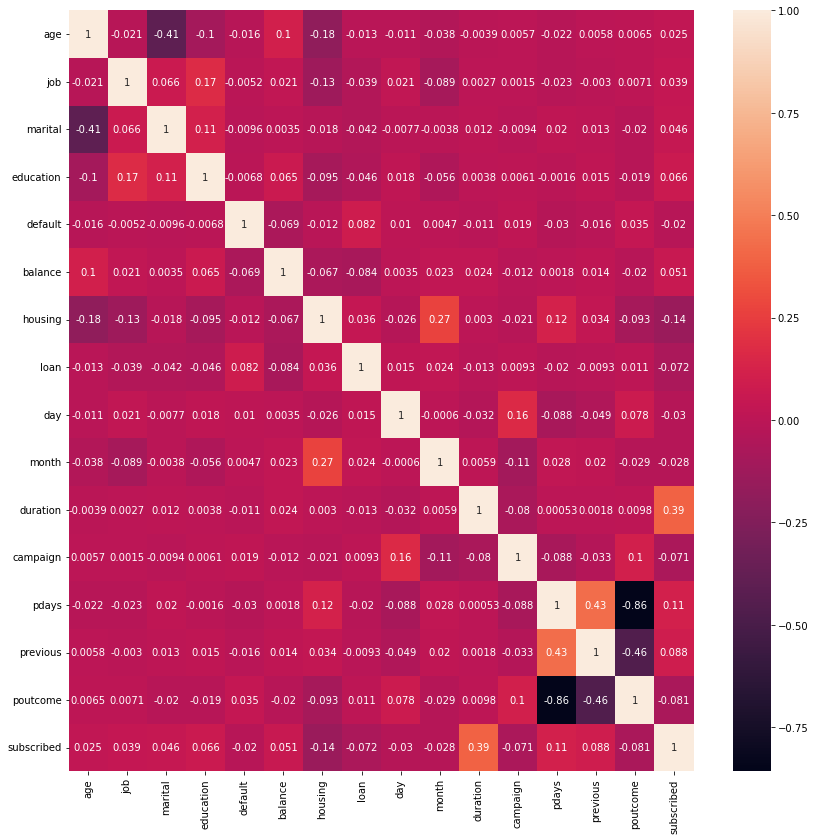

In [35]:
#displaying Correlation using heatmap
plt.figure(figsize=(14,14))
sns.heatmap(df_bank.corr(),annot=True)

Obs- 
* "highly positive correlated columns"- None
* "positive correlated columns"- "pdays and previous","duration and subsribed"
* "highly negative correlated columns"- "pdays and poutcome"
* "negative correlated columns"- "age and marital"
So we will be deleting one of the "pdays" or "poutcome" columns, deciding that by further checking the VIF 

### Variance Inflation Factor(VIF) [ For finding Multi-Collinearity]

In [36]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
X=df_bank.iloc[:,0:-1] # Seperating input columns from data frame
def vif_calc():
    vif=pd.DataFrame()
    vif['VIF Factor']=[variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
    vif['Features']=X.columns
    print(vif)

In [37]:
vif_calc()

    VIF Factor   Features
0    12.564684        age
1     2.830829        job
2     4.717749    marital
3     3.708236  education
4     1.031647    default
5     1.243477    balance
6     2.507871    housing
7     1.208114       loan
8     4.567276        day
9     4.656019      month
10    2.004161   duration
11    1.877018   campaign
12    3.062161      pdays
13    1.330697   previous
14   17.975701   poutcome


In [ ]:
Obs- We can see high VIF in  poutcome and age columns, will be dropping poutcome.

In [38]:
# dropping poutcome column
df_bank.drop('poutcome',axis = 1,inplace = True)
df_bank.shape

(31647, 15)

## Data Transformation

### Checking for skewness

In [39]:
df_bank.skew()

age            0.681607
job            0.264817
marital       -0.100071
education      0.199441
default        7.149903
balance        7.995696
housing       -0.223918
loan           1.833474
day            0.087185
month         -0.486498
duration       3.199766
campaign       4.873935
pdays          2.642374
previous      49.302348
subscribed     2.377445
dtype: float64

Obs- We can see skewness is present in columns: "age","default","balance","loan","duration","campaign","pdays","previous"

### Applying Transformation Method

In [40]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer() #deafault method=boxcox

skew_col = ["age","default","balance","loan","duration","campaign","pdays","previous"]
df_bank[skew_col]= pt.fit_transform(df_bank[skew_col].values)

In [ ]:
df_bank.skew()

Obs-We can observe there is a considerable decrease in the skewness after the transformation

## Checking for outliers

In [41]:
# Method 1: Z-score
from scipy.stats import zscore
z=np.abs(zscore(df_bank))
threshold=3
print(np.where(z>3))

(array([   10,    26,   109, ..., 31614, 31618, 31646], dtype=int64), array([ 4,  5,  4, ...,  4,  4, 10], dtype=int64))


Obs-From the box plot, we already visualized outliers were present earlier in multiple columns.

Here it is exactly showing the locations where outliers are present, removing these locations data further

In [42]:
df_bank_new=df_bank[(z<3).all(axis=1)]

In [43]:
print("df_bank.shape:",df_bank.shape, "\ndf_bank_new.shape:",df_bank_new.shape)

df_bank.shape: (31647, 15) 
df_bank_new.shape: (30386, 15)


In [44]:
# Let's check the the data loss
data_loss = (31647-30386)/31647*100
data_loss

3.9845798969886563

In [45]:
# Method 2: IQR(Inter Quartile) Method
Q1=df_bank.quantile(0.25)
Q3=df_bank.quantile(0.75)
IQR=Q3 - Q1

df_bank_new2=df_bank[~((df_bank < (Q1 - 1.5 * IQR)) |(df_bank > (Q3 + 1.5 * IQR))).any(axis=1)]

In [46]:
print("df_bank.shape:",df_bank.shape, "\ndf_bank_new2:",df_bank_new2.shape)

df_bank.shape: (31647, 15) 
df_bank_new2: (16655, 15)


In [47]:
# Let's check the the data loss
data_loss2 = (31647-16655)/31467*100
data_loss2

47.64356309784854

Obs- The Data Loss in IQR method is very high, so we will be going with Z-score method

In [49]:
df_bank=df_bank_new # Assigning back the new created dataframe

In [50]:
df_bank.shape

(30386, 15)

### Creating Input(Predictor) and Output(Target) Columns

In [51]:
x=df_bank.drop(columns=['subscribed'],axis=1)
y=df_bank['subscribed']

### Data Scaling

In [52]:
from sklearn.preprocessing import StandardScaler
st=StandardScaler()
x_scale=st.fit_transform(x)
x_scale

array([[ 1.34949687, -1.31945913, -0.27644023, ...,  0.13622289,
        -0.47355285, -0.47353113],
       [-0.96983523,  2.03492176, -0.27644023, ...,  0.13622289,
        -0.47355285, -0.47353113],
       [-1.54447747,  0.81514689, -0.27644023, ..., -1.10930655,
        -0.47355285, -0.47353113],
       ...,
       [ 1.14318966, -0.09968426, -1.92445136, ...,  0.13622289,
        -0.47355285, -0.47353113],
       [-0.83951836, -0.09968426,  1.37157091, ...,  0.7403941 ,
        -0.47355285, -0.47353113],
       [ 1.41539873,  1.42503433, -0.27644023, ...,  1.61189804,
         2.13339126,  2.16843438]])

In [53]:
x=pd.DataFrame(data=x_scale)

### Checking for Imbalance

In [54]:
print(y.value_counts())

0    26823
1     3563
Name: subscribed, dtype: int64


Obs-We can see the target is imbalanced, and therefore we need to balance it.

#### Oversampling using SMOTE

pip install imblearn

In [55]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y= SM.fit_resample(x,y)

In [56]:
print(y.value_counts())

0    26823
1    26823
Name: subscribed, dtype: int64


## Data Modelling

### Finding Best Random State

In [57]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    dtc= DecisionTreeClassifier()
    dtc.fit(x_train, y_train)
    pred = dtc.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9025102522679259  on Random_state  9


### Splitting data into Train-Test

In [58]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=9)

In [59]:
x_train.shape

(37552, 14)

In [60]:
y_train.shape

(37552,)

In [61]:
x_test.shape

(16094, 14)

In [62]:
y_test.shape

(16094,)

## Using various Machine Learning Algorithms

In [63]:
#importing necessary libraries
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, accuracy_score

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

### 1. Logistic Regression

In [64]:
lg=LogisticRegression()
lg.fit(x_train,y_train)
predlg=lg.predict(x_test)
print("Accuracy Score:",accuracy_score(y_test,predlg))
print("Confusion Matrix:\n",confusion_matrix(y_test,predlg))
print("Classification Report:\n",classification_report(y_test,predlg))

Accuracy Score: 0.811109730334286
Confusion Matrix:
 [[6433 1625]
 [1415 6621]]
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.80      0.81      8058
           1       0.80      0.82      0.81      8036

    accuracy                           0.81     16094
   macro avg       0.81      0.81      0.81     16094
weighted avg       0.81      0.81      0.81     16094



Obs- The Logistic Regression has provided the accuracy_score:0.811109730334286 and f1-score:0.81

### 2. GaussianNB

In [65]:
gnb=GaussianNB()
gnb.fit(x_train,y_train)
predgnb=gnb.predict(x_test)
print("Accuracy:",accuracy_score(y_test,predgnb))
print("Confusion Matrix:\n",confusion_matrix(y_test,predgnb))
print("Classification Report:\n",classification_report(y_test,predgnb))

Accuracy: 0.7698521188020381
Confusion Matrix:
 [[6260 1798]
 [1906 6130]]
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.78      0.77      8058
           1       0.77      0.76      0.77      8036

    accuracy                           0.77     16094
   macro avg       0.77      0.77      0.77     16094
weighted avg       0.77      0.77      0.77     16094



Obs- The GaussianNB has provided the accuracy_score:0.7698521188020381 and f1-score:0.77

### 3.Decision Tree Classifier

In [66]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
preddtc=dtc.predict(x_test)
print("Accuracy:",accuracy_score(y_test,preddtc))
print("Confusion Matrix:\n",confusion_matrix(y_test,preddtc))
print("Classification Report:\n",classification_report(y_test,preddtc))

Accuracy: 0.9015782279110227
Confusion Matrix:
 [[7178  880]
 [ 704 7332]]
Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.89      0.90      8058
           1       0.89      0.91      0.90      8036

    accuracy                           0.90     16094
   macro avg       0.90      0.90      0.90     16094
weighted avg       0.90      0.90      0.90     16094



Obs- The Decision Tree Classifier has provided the accuracy-score:0.9015782279110227 and f1-score:0.90

### 4.K Nearest Neighbor Classifier

In [67]:
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
predknn=knn.predict(x_test)
print("Accuracy:",accuracy_score(y_test,predknn))
print("Confusion Matrix:\n",confusion_matrix(y_test,predknn))
print("Classification Report:\n",classification_report(y_test,predknn))

Accuracy: 0.8971045109978875
Confusion Matrix:
 [[6518 1540]
 [ 116 7920]]
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.81      0.89      8058
           1       0.84      0.99      0.91      8036

    accuracy                           0.90     16094
   macro avg       0.91      0.90      0.90     16094
weighted avg       0.91      0.90      0.90     16094



Obs- The K Nearest Neighbor Classifier has provided the accuracy-score:0.8971045109978875 and f1-score:0.89

### 5.Support Vector Machine Classifier

In [68]:
svc=SVC()
svc.fit(x_train,y_train)
predsvc=svc.predict(x_test)
print("Accuracy:",accuracy_score(y_test,predsvc))
print("Confusion Matrix:\n",confusion_matrix(y_test,predsvc))
print("Classification Report:\n",classification_report(y_test,predsvc))

Accuracy: 0.8529886914378029
Confusion Matrix:
 [[6465 1593]
 [ 773 7263]]
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.80      0.85      8058
           1       0.82      0.90      0.86      8036

    accuracy                           0.85     16094
   macro avg       0.86      0.85      0.85     16094
weighted avg       0.86      0.85      0.85     16094



Obs- The Support Vector Machine Classifier has provided the accuracy-score:0.8529886914378029 and f1-score:0.85

### 6. Ensemble Methods

#### 6.1 Random Forest Classifier

In [69]:
rf=RandomForestClassifier(n_estimators=100)
rf.fit(x_train,y_train)
predrf=rf.predict(x_test)
print("Accuracy:",accuracy_score(y_test,predrf))
print("Confusion Matrix:\n",confusion_matrix(y_test,predrf))
print("Classification Report:\n",classification_report(y_test,predrf))

Accuracy: 0.9438299987573009
Confusion Matrix:
 [[7419  639]
 [ 265 7771]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.92      0.94      8058
           1       0.92      0.97      0.95      8036

    accuracy                           0.94     16094
   macro avg       0.94      0.94      0.94     16094
weighted avg       0.94      0.94      0.94     16094



Obs- The Random Forest Classifier has provided the accuracy-score:0.9438299987573009 and f1-score:0.94

#### 6.2 Ada Boost Classifier

In [70]:
ad=AdaBoostClassifier(n_estimators=50,learning_rate=1.0)
ad.fit(x_train,y_train)
predad=ad.predict(x_test)
print("Accuracy:",accuracy_score(y_test,predad))
print("Confusion Matrix:\n",confusion_matrix(y_test,predad))
print("Classification Report:\n",classification_report(y_test,predad))

Accuracy: 0.8644215235491487
Confusion Matrix:
 [[6931 1127]
 [1055 6981]]
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.86      0.86      8058
           1       0.86      0.87      0.86      8036

    accuracy                           0.86     16094
   macro avg       0.86      0.86      0.86     16094
weighted avg       0.86      0.86      0.86     16094



Obs- The Ada Boost Classifier has provided the accuracy-score:0.8644215235491487 and f1-score:0.86

#### 6.3 Gradient Boosting Classifier

In [71]:
gb=GradientBoostingClassifier()
gb.fit(x_train,y_train)
predgb=gb.predict(x_test)
print("Accuracy:",accuracy_score(y_test,predgb))
print("Confusion Matrix:\n",confusion_matrix(y_test,predgb))
print("Classification Report:\n",classification_report(y_test,predgb))

Accuracy: 0.9079781284950913
Confusion Matrix:
 [[7161  897]
 [ 584 7452]]
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.89      0.91      8058
           1       0.89      0.93      0.91      8036

    accuracy                           0.91     16094
   macro avg       0.91      0.91      0.91     16094
weighted avg       0.91      0.91      0.91     16094



Obs- The Gradient Boosting Classifier has provided the accuracy-score:0.9079781284950913 and f1-score:0.91

## Cross Validation

In [79]:
from sklearn.model_selection import cross_val_score

In [80]:
#Taking 10 fold value for cross validation
#cv score for Logistic Regression 
print('CV score  for Logistic rgerssion',cross_val_score(lg,x,y,cv=10).mean())

CV score  for Logistic rgerssion 0.8097902762748863


In [81]:
# cv score for Gaussian NB 
print('CV score  for Gaussian NB ',cross_val_score(gnb,x,y,cv=10).mean())

CV score  for Gaussian NB  0.767382731030035


In [82]:
# cv score for Decision Tree Classifier 
print('CV score  for Decision Tree Classifier ',cross_val_score(dtc,x,y,cv=10).mean())

CV score  for Decision Tree Classifier  0.9015783835212208


In [83]:
# cv score for K Neighbors Classifier 
print('CV score  for K Neighbors Classifier ',cross_val_score(knn,x,y,cv=10).mean())

CV score  for K Neighbors Classifier  0.9060322067033477


In [86]:
# cv score for Random Forest Classifier
print('CV score  for Random Forest Classifier ',cross_val_score(rf,x,y,cv=10).mean())

CV score  for Random Forest Classifier  0.9440786493505773


In [87]:
# cv score for Ada Boost Classifier
print('CV score  for Ada Boost Classifier ',cross_val_score(ad,x,y,cv=5).mean())

CV score  for Ada Boost Classifier  0.8626002793380284


In [88]:
# cv score for GradientBoostingClassifier
print('CV score  for GradientBoostingClassifier ',cross_val_score(gb,x,y,cv=5).mean())

CV score  for GradientBoostingClassifier  0.9005158884687459


In [ ]:
Obs-From the observation of accuracy and cross validation score and their difference we can predict that Random Forest Classifier is the best model.

## Hyper Parameter Tuning

In [103]:
#Applying parameter values on Random Forest Classifier
bank_best=RandomForestClassifier(criterion='entropy', max_features= 'log2', n_estimators=100)
bank_best.fit(x_train,y_train)
predrff=bank_best.predict(x_test)
print("Accuracy:",accuracy_score(y_test,predrff))
print("Confusion Matrix:\n",confusion_matrix(y_test,predrff))
print("Classification Report:\n",classification_report(y_test,predrff))

Accuracy: 0.9424008947433826
Confusion Matrix:
 [[7407  651]
 [ 276 7760]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.92      0.94      8058
           1       0.92      0.97      0.94      8036

    accuracy                           0.94     16094
   macro avg       0.94      0.94      0.94     16094
weighted avg       0.94      0.94      0.94     16094



In [ ]:
Obs- Our best fit model has given accuracy score=0.9424008947433826 and f1-score=0.94

## Plotting ROC-AUC curve for best model

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

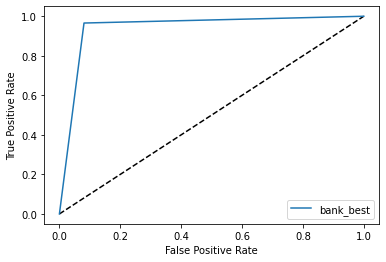

In [104]:
fpr,tpr,threshholds=roc_curve(y_test,predrff)
auc = roc_auc_score(y_test,predrff)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='bank_best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

## Saving the best model

In [105]:
import joblib

joblib.dump(bank_best,'Bank.obj')

['Bank.obj']

In [106]:
bank_model=joblib.load('Bank.obj')

In [107]:
bank_model

RandomForestClassifier(criterion='entropy', max_features='log2')

## Predicting the Output/ Loading The Test Data Set

In [108]:
# loading the  test dataset
bank_test=pd.read_csv("term deposit test.csv")
bank_test

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,38441,32,services,married,secondary,no,118,yes,no,cellular,15,may,20,6,-1,0,unknown
1,40403,78,retired,divorced,primary,no,2787,no,no,telephone,1,jul,372,1,-1,0,unknown
2,3709,31,self-employed,single,tertiary,no,144,yes,no,unknown,16,may,676,1,-1,0,unknown
3,37422,57,services,single,primary,no,3777,yes,no,telephone,13,may,65,2,-1,0,unknown
4,12527,45,blue-collar,divorced,secondary,no,-705,no,yes,unknown,3,jul,111,1,-1,0,unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,23465,39,management,married,tertiary,no,45,no,no,cellular,28,aug,148,4,-1,0,unknown
13560,11743,54,blue-collar,married,primary,no,2281,yes,no,unknown,20,jun,158,1,-1,0,unknown
13561,28292,35,retired,married,primary,no,285,yes,no,cellular,29,jan,136,1,-1,0,unknown
13562,45163,29,admin.,single,secondary,no,464,no,no,cellular,9,nov,208,2,91,3,success


### Performing the few necessary EDA steps first and then predicting the output for the provided test data

In [113]:
bank_test.shape

(13564, 17)

In [114]:
# Dropping the unnecesaary columns
bank_test.drop('ID',axis = 1,inplace = True)
bank_test.shape

(13564, 16)

In [117]:
bank_test.drop('contact',axis = 1,inplace = True)
bank_test.shape

(13564, 15)

In [119]:
# Encoding the categorical columns
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()
bank_test['job']=le.fit_transform(bank_test['job'])
bank_test['marital']=le.fit_transform(bank_test['marital'])
bank_test['education']=le.fit_transform(bank_test['education'])
bank_test['default']=le.fit_transform(bank_test['default'])
bank_test['housing']=le.fit_transform(bank_test['housing'])
bank_test['loan']=le.fit_transform(bank_test['loan'])
bank_test['month']=le.fit_transform(bank_test['month'])
bank_test['poutcome']=le.fit_transform(bank_test['poutcome'])
bank_test

,age,job,marital,education,default,balance,housing,loan,day,month,duration,campaign,pdays,previous,poutcome
0,32,7,1,1,0,118,1,0,15,8,20,6,-1,0,3
1,78,5,0,0,0,2787,0,0,1,5,372,1,-1,0,3
2,31,6,2,2,0,144,1,0,16,8,676,1,-1,0,3
3,57,7,2,0,0,3777,1,0,13,8,65,2,-1,0,3
4,45,1,0,1,0,-705,0,1,3,5,111,1,-1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,39,4,1,2,0,45,0,0,28,1,148,4,-1,0,3
13560,54,1,1,0,0,2281,1,0,20,6,158,1,-1,0,3
13561,35,5,1,0,0,285,1,0,29,4,136,1,-1,0,3
13562,29,0,2,1,0,464,0,0,9,9,208,2,91,3,2


In [120]:
# dropping poutcome column
bank_test.drop('poutcome',axis = 1,inplace = True)
bank_test.shape

(13564, 14)

### Finally Predicting the output of test data set with our best-model

In [124]:
#To print all row values
pd.set_option('display.max_rows',None)
predicted = bank_model.predict(bank_test)
test_subscribed=pd.DataFrame(predicted)
test_subscribed #no=0, yes=1

,0
0,1
1,1
2,1
3,1
4,1
5,1
6,1
7,1
8,1
9,1


In [126]:
print(test_subscribed.value_counts())

1    10992
0     2572
dtype: int64


## Conclusion: 
According to our best fit model from the provided test dataset, the number of customers who can get ready for taking a term deposit=10992, while who may not take a term deposit=2572

### Appending the test_subscribed in the original test data set to form a data frame

In [128]:
target_list=pd.read_csv("term deposit test.csv")
target_list['Subs-Chance']=test_subscribed

In [129]:
target_list

,ID,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Subs-Chance
0,38441,32,services,married,secondary,no,118,yes,no,cellular,15,may,20,6,-1,0,unknown,1
1,40403,78,retired,divorced,primary,no,2787,no,no,telephone,1,jul,372,1,-1,0,unknown,1
2,3709,31,self-employed,single,tertiary,no,144,yes,no,unknown,16,may,676,1,-1,0,unknown,1
3,37422,57,services,single,primary,no,3777,yes,no,telephone,13,may,65,2,-1,0,unknown,1
4,12527,45,blue-collar,divorced,secondary,no,-705,no,yes,unknown,3,jul,111,1,-1,0,unknown,1
5,16013,32,management,single,tertiary,no,0,yes,no,cellular,22,jul,455,2,-1,0,unknown,1
6,196,33,blue-collar,single,secondary,no,307,yes,no,unknown,5,may,309,2,-1,0,unknown,1
7,8516,37,management,married,secondary,no,341,no,no,unknown,3,jun,120,2,-1,0,unknown,1
8,31208,36,technician,divorced,tertiary,no,1381,no,no,cellular,2,mar,149,1,-1,0,unknown,1
9,38462,50,admin.,single,primary,no,181,yes,no,cellular,15,may,119,4,372,3,failure,1


Obs- We can see Subs-Chance Column given by our model has been added to the provided test dataset